#  Comparison based on climatological means spatial temperature patterns 

## Load required libraries

In [1]:
import numpy as np   
import pandas as pd   
import netCDF4 as nc         
from netCDF4 import Dataset
import matplotlib.pyplot as plt    
import xarray as xr            
import cartopy.crs as ccrs  
import cartopy      
import os  
import xesmf as xe
from cartopy.feature import NaturalEarthFeature
import cartopy.crs as ccrs 
import cartopy.feature as cf
from cartopy.util import add_cyclic_point
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

## For parallelisation

In [2]:
from dask.distributed import Client
client = Client(n_workers=16, threads_per_worker=2, memory_limit='32GB')
client

/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 43329 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:43329/status,
Dashboard: http://127.0.0.1:43329/status,Workers: 16
Total threads: 32,Total memory: 476.84 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43203,Workers: 16
Dashboard: http://127.0.0.1:43329/status,Total threads: 32
Started: Just now,Total memory: 476.84 GiB
Comm: tcp://127.0.0.1:45169,Total threads: 2
Dashboard: http://127.0.0.1:34887/status,Memory: 29.80 GiB
Nanny: tcp://127.0.0.1:43679,


## Set variables

In [3]:
# Set product to be the reference 
ref = 'era5_land' # era5_land, esa_gf 

# Weither to locate stations or not
stations_pointed = 'stations_located'  # stations_non_located
# Weither to locate contour or not 
contour_localisation = 'contour_located'  # conour_non_located 




# Cold months
wet_months_labels = ["NOV","DEC","JAN","FEB","MAR","APR"]

# Dry months 
dry_months_labels = ["MAY","JUN","JUL","AUG","SEP","OCT"]

months_key = ['wet','dry']
months_labels = {'wet':wet_months_labels,'dry':dry_months_labels}

latlim = slice(30,34.5)
lonlim = slice(-10, -2)
period = slice('1982-01-01', '2014-12-31')

# Set input data paths 
path_cmip6_raw_data = '/home/hchaabani/Data/tas/cmip6/raw_data'
path_cmip6 = '/home/hchaabani/Data/tas/cmip6/modified_data/monthly_values_plus_alt'
path_era5 = '/home/hchaabani/Data/tas/reanalysis/era5/modified_data/monthly_values_plus_alt'
path_era5_land = '/home/hchaabani/Data/tas/reanalysis/era5_land/modified_data/monthly_values_plus_alt'
path_SIM_35km = '/home/hchaabani/Data/tas/SIM_35km/modified_data/monthly_values_plus_alt'

cmip6_labels = os.listdir(path_cmip6_raw_data)
products_labels = ['era5_land','era5', 
                   'SIM_35km'] + cmip6_labels
# Set output figure directory 
output_path_figures = '/home/hchaabani/Hamid/PHD-mountain-climate/First_Part/Results/figures/maps/v7/bias/tas/ref_'+ref+'/'+stations_pointed+'/'+contour_localisation

# Parameter to plot 
par = 'tas'

dic_data = {prod:'data' for prod in products_labels}

# Number of days of each month
mon_days = {'wet':[30,31,31,30,28,31],'dry':[31,30,31,31,30,31]}
months = {'wet':[11,12,1,2,3,4],'dry':[5,6,7,8,9,10]}

leg_title = 'bias of monthly mean precipitations in mm'
max_leg = 15
min_leg = -15

# Dictionnaries of products titles 
y_titles = {'era5_land':'era5_land-10km','era5':'era5-25km',
            'SIM_35km':'lmdz-or-zo-ma-35km-or','BCC-CSM2-HR':'BCC-CSM2-HR',
            'EC-Earth3P-HR':'EC-Earth3P-HR-25km',
            'IPSL-CM6A-ATM-ICO-HR':'IPSL-CM6A-ATM-ICO-HR-50km',
            'IPSL-CM6A-ATM-ICO-VHR':'IPSL-CM6A-ATM-ICO-VHR-25km',
            'IPSL-CM6A-ATM-HR':'IPSL-CM6A-ATM-HR',
            'CNRM-CM6-1-HR':'CNRM-CM6-1-HR-50km'} 

# We define stations labels and coordinates to be pointed on the map
lats = np.array([33.5,32.67,31.53,31.50,31.56,31.20,36])
lons = np.array([-5.16,-4.74,-6.30,-6.45,-6.29,-7.86, -9.8])
names = [" IFR", " MID", "", "TIC,MGN,TIZ", "", " OUK"]

## Importing and preparing data 

In [4]:
for prod in products_labels[3:]:
    dic_data[prod] = xr.open_dataset(path_cmip6 + '/tas_monthly_'+prod+'.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()

latlim = slice(34.5,30)   
dic_data['era5_land'] = xr.open_dataset(path_era5_land + '/tas_monthly_era5_land.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
dic_data['era5'] = xr.open_dataset(path_era5 + '/tas_monthly_era5.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
dic_data['SIM_35km'] = xr.open_dataset(path_SIM_35km + '/tas_monthly_SIM_35km.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()        

In [5]:
ref_data = dic_data[ref]   

In [6]:
if ref=='era5_land':
    elevation = ref_data['elevation']
else:
    elevation = dic_data['era5_land']['elevation']   

In [7]:
if ref=='era5_land':
    contour_1000m = ref_data['elevation']
else:
    econtour_1000m = dic_data['era5_land']['elevation']  

In [8]:
dic_data.pop(ref)
products_labels.remove(ref)

In [9]:
for prod in products_labels:
    print(prod)
    print("---------------")
    print(dic_data[prod])
    print("=================================================================")

era5
---------------
<xarray.Dataset>
Dimensions:    (time: 396, lon: 33, lat: 19)
Coordinates:
  * time       (time) datetime64[ns] 1982-01-16T11:00:00 ... 2014-12-16T11:00:00
  * lon        (lon) float32 -10.0 -9.75 -9.5 -9.25 ... -2.75 -2.5 -2.25 -2.0
  * lat        (lat) float32 34.5 34.25 34.0 33.75 ... 30.75 30.5 30.25 30.0
Data variables:
    tas        (time, lat, lon) float32 289.2 289.2 289.2 ... 284.3 284.1 283.9
    elevation  (lat, lon) int16 0 0 0 0 0 0 0 0 ... 323 318 309 297 283 259 124
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Fri Sep 01 18:44:16 2023: cdo monmean t2m_era5_1982-2014_da...
    frequency:    mon
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...
SIM_35km
---------------
<xarray.Dataset>
Dimensions:    (time: 396, lon: 24, lat: 15)
Coordinates:
  * time       (time) datetime64[ns] 1982-01-16T12:00:00 ... 2014-12-16T12:00:00
  * lon  

## Calculate mean bias

### regridding 

In [10]:
ref_regridded = {prod:'data' for prod in products_labels}   

In [11]:
if ref=='era5_land':
    for prod in products_labels:
        regridder = xe.Regridder(ref_data, dic_data[prod],"conservative")
        ref_regridded[prod] = regridder(ref_data, keep_attrs=True)
    
if ref=='era5':
    for prod in products_labels[1:]:
        regridder = xe.Regridder(ref_data, dic_data[prod],"conservative")
        ref_regridded[prod] = regridder(ref_data, keep_attrs=True)
        
    for prod in products_labels[0:1]:
        regridder = xe.Regridder(dic_data[prod], ref_data,"conservative")
        dic_data[prod] = regridder(dic_data[prod], keep_attrs=True)
        ref_regridded[prod] = ref_data

/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/cf_xarray/accessor.py:1744: UserWarning: Variables {'lon_bnds'} not found in object but are referred to in the CF attributes.
  warnings.warn(


In [12]:
""" 
We define a dictionnary that will contain the five datasets of monthly averages of all
above-mentioned variables 
"""
monthly_means_bias = {prod:'a' for prod in products_labels}

In [13]:
for prod in products_labels:
    monthly_means_bias[prod] = dic_data[prod].groupby('time.month').mean(dim='time') - ref_regridded[prod].groupby('time.month').mean(dim='time')       

In [14]:
for prod in products_labels:
    print('========================== '+prod+' ===============================')
    print(monthly_means_bias[prod])                 

========================== era5 ===============================
<xarray.Dataset>
Dimensions:    (lon: 33, lat: 19, month: 12)
Coordinates:
  * lon        (lon) float32 -10.0 -9.75 -9.5 -9.25 ... -2.75 -2.5 -2.25 -2.0
  * lat        (lat) float32 34.5 34.25 34.0 33.75 ... 30.75 30.5 30.25 30.0
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    tas        (month, lat, lon) float64 nan nan nan nan ... 86.29 86.23 145.6
    elevation  (month, lat, lon) int16 0 0 0 0 0 0 0 0 0 ... 0 0 -1 1 0 1 0 -1
========================== SIM_35km ===============================
<xarray.Dataset>
Dimensions:    (lon: 24, lat: 15, month: 12)
Coordinates:
  * lon        (lon) float32 -9.765 -9.43 -9.095 -8.76 ... -2.733 -2.398 -2.064
  * lat        (lat) float32 34.36 34.06 33.77 33.48 ... 31.13 30.84 30.55 30.26
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    tas        (month, lat, lon) float64 nan nan nan nan ... -1.983 -1.484 44.1
    elevation  (mont

In [15]:
for prod in products_labels:
    monthly_means_bias[prod]['elevation'] = ref_regridded[prod]['elevation']

/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/home/hchaabani/anaconda3/envs/first_part/li

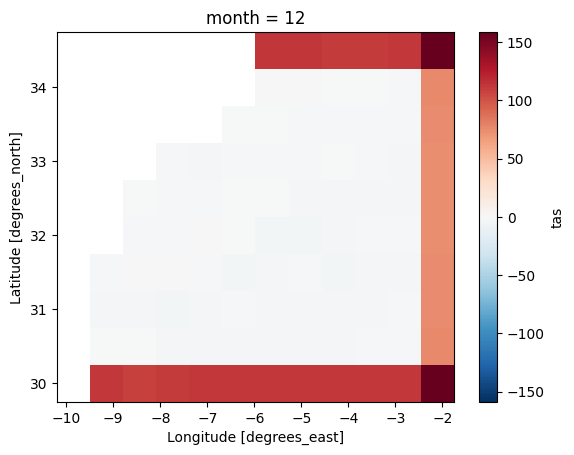

In [16]:
monthly_means_bias['IPSL-CM6A-ATM-HR'].loc[{'month':12}][par].plot()

## Plots

<div class="alert alert-block alert-success"; background-color:red> We define the formatting function of the figures </div> 

In [17]:
# This auxiliary function will help us in the formatting of the figures
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

<div class="alert alert-block alert-success"; background-color:red> We personalize the colorbar </div> 

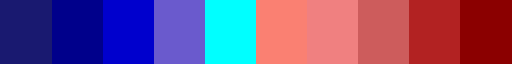

In [18]:
import matplotlib as mpl

c0='midnightblue'
c1='darkblue' 
c2='mediumblue' 
c3='slateblue'
c4='cyan'
c6 = 'salmon'
c7='lightcoral' 
c8='indianred'
c9= 'firebrick'
c10= 'darkred'

cmap_init = mpl.colors.ListedColormap([c0,c1,c2,c3,c4,c6,c7,c8,c9,c10])
cmap_init

In [19]:
products_labels

['era5',
 'SIM_35km',
 'EC-Earth3P-HR',
 'IPSL-CM6A-ATM-HR',
 'BCC-CSM2-HR',
 'IPSL-CM6A-ATM-ICO-HR',
 'IPSL-CM6A-ATM-ICO-VHR',
 'CNRM-CM6-1-HR']

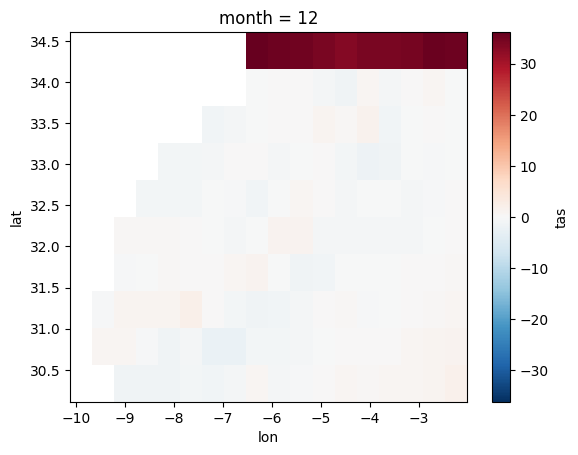

In [20]:
monthly_means_bias['BCC-CSM2-HR'].loc[{'month':12}][par].plot()

In [21]:
products_labels

['era5',
 'SIM_35km',
 'EC-Earth3P-HR',
 'IPSL-CM6A-ATM-HR',
 'BCC-CSM2-HR',
 'IPSL-CM6A-ATM-ICO-HR',
 'IPSL-CM6A-ATM-ICO-VHR',
 'CNRM-CM6-1-HR']

In [22]:
for ikey_mon, key_mon in enumerate(['wet','dry']):
    # Define the figure and each axis for the 3 rows and 3 columns
    fig, axs = plt.subplots(nrows=8,ncols=6,
                            subplot_kw={'projection': ccrs.PlateCarree()}, dpi=600) #   figsize=(11,8.5)
    # Formatting figure 
    plt.subplots_adjust(wspace=0.08,hspace=0.06)
    set_size(14,18)      
    # Axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array as follow 
    axs=axs.flatten()

    i_ax=0 
    for ipord,prod in enumerate(products_labels):
        for imon,mon in enumerate(months[key_mon]):
            
            # Select the data of month mon and of produc
            data = monthly_means_bias[prod].where(monthly_means_bias[prod]['elevation']>=1000).loc[{'month':mon}][par]
   
            contour = contour_1000m
                
            # Plot climatological mean where the altitude is above 1000m. 
            cs = data.plot(ax=axs[i_ax], cmap=cmap_init , add_colorbar=False, vmin=min_leg, 
                           vmax=max_leg, add_labels=False)
            
            # Plot contour 1000m 
            if contour_localisation == 'contour_located':
                contour.plot.contour(ax=axs[i_ax],levels=[1000],colors='k',linestyles='-')                                            
            
            # Add features: ocean, its color ...  
            axs[i_ax].add_feature(cf.NaturalEarthFeature('physical', 'ocean', '50m', edgecolor='face',
                                                         facecolor='cyan'))
            # Set domaine extent
            axs[i_ax].set_extent([ -10, -2, 30, 37])
            axs[i_ax].set_title('')
            
            # Pointing the stations on one of the boxplots
            if stations_pointed == 'stations_located':
                axs[i_ax].scatter(lons, lats, 20, color='black', marker=".", edgecolor='black')
                for j in range(len(names)):
                    axs[i_ax].text(lons[j], lats[j], names[j], va="top", family="monospace", weight="bold", 
                                       fontsize=10, color='black')
            
            
            # Draw the coastines for each subplot
            axs[i_ax].coastlines()
                                                                                            
            i_ax=i_ax+1
        
    # Set y labels at products names     
    k=0
    for i_ax in range(0,45,6):
        axs[i_ax].set_ylabel(y_titles[products_labels[k]],  fontsize=11)
        k=k+1
    
    # Set subtitles for each subplot
    for i_ax in range(6):
        axs[i_ax].set_title(months_labels[key_mon][i_ax]+'\n',  fontsize=16)
    
    # Longitude labels
    for i in range(42,48):
        axs[i].set_xticks(np.arange(-10,-2,3), crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter()
        axs[i].xaxis.set_major_formatter(lon_formatter)
        axs[i].set_xlabel('')
        
    # Latitude labels
    for i in range(0,45,6):
        axs[i].set_yticks(np.arange(30,37,2), crs=ccrs.PlateCarree())
        lat_formatter = LatitudeFormatter()
        axs[i].yaxis.set_major_formatter(lat_formatter)
       
    # Add a colorbar axis at the bottom of the graph
    cbar_ax = fig.add_axes([0.15, 0.08, 0.73, 0.01])

    # Draw the colorbar     
    cb = fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init ,ticks=[val for val in range(min_leg,max_leg+1,3)], 
                      label=leg_title, orientation='horizontal') 
    cb.set_label(label=leg_title, weight='bold',size='large')
    cb.ax.tick_params(labelsize='large')        

    # Store figures in png and pdf                                              
    #plt.savefig(output_path_figures+'/'+par+'_bias_'+key_mon+'_months_monthly_averages_threshold_snc_'+threshold+'.pdf')         
    #plt.savefig(output_path_figures+'/'+par+'_bias_'+key_mon+'_months_monthly_averages_threshold_snc_'+threshold+'.png')  

/tmp/ipykernel_12426/1249420776.py:75: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init ,ticks=[val for val in range(min_leg,max_leg+1,3)],
/tmp/ipykernel_12426/1249420776.py:75: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init ,ticks=[val for val in range(min_leg,max_leg+1,3)],
/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/home/hcha